<a href="https://colab.research.google.com/github/RyosukeHanaoka/TechTeacher/blob/main/modified_mediapipe_hand_landmarker.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Hand Landmarks Detection with MediaPipe Tasks

This notebook shows you how to use MediaPipe Tasks Python API to detect hand landmarks from images.

## Preparation

Let's start with installing MediaPipe.

In [ ]:
!pip install -q mediapipe==0.10.0

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 33.9/33.9 MB 39.0 MB/s eta 0:00:00


Then download an off-the-shelf model bundle. Check out the [MediaPipe documentation](https://developers.google.com/mediapipe/solutions/vision/hand_landmarker#models) for more information about this model bundle.

In [ ]:
!wget -q https://storage.googleapis.com/mediapipe-models/hand_landmarker/hand_landmarker/float16/1/hand_landmarker.task

## Visualization utilities

In [11]:
import os
import cv2
from mediapipe import solutions
from mediapipe.framework.formats import landmark_pb2
import numpy as np

In [12]:
# 正規化されたランドマーク位置をピクセル位置に変換する
def convert_to_pixel_coordinates(normalized_x, normalized_y, image_width, image_height):
    return int(normalized_x * image_width), int(normalized_y * image_height)

In [13]:
MARGIN = 10  # pixels
FONT_SIZE = 1
FONT_THICKNESS = 1
HANDEDNESS_TEXT_COLOR = (88, 205, 54) # vibrant green

In [14]:
# 正規化されたランドマーク位置をピクセル位置に変換する
def convert_to_pixel_coordinates(normalized_x, normalized_y, image_width, image_height):
    return int(normalized_x * image_width), int(normalized_y * image_height)

def save_cropped_images(image, hand_landmarks, handedness, directory):
    height, width, _ = image.shape

    # 切り出した画像を格納するディレクトリを作る。適宜ディレクトリの名称を'directory'と書かれているところに入力する。
    if not os.path.exists(directory):
        os.mkdir(directory)

    for idx, landmark in enumerate(hand_landmarks):
        pixel_x, pixel_y = convert_to_pixel_coordinates(landmark.x, landmark.y, width, height)

        # 必要に応じてxとyを入力してトリミングするサイズを調節する
        left = max(0, pixel_x - x_mm)
        right = min(width, pixel_x + x_mm)
        top = max(0, pixel_y - y_mm)
        bottom = min(height, pixel_y + y_mm)

        cropped_image = image[top:bottom, left:right]

        joint_type = landmark_pb2.Landmark.Name(idx)
        hand_type = handedness[0].category_name

        # 関節の種類によってディレクトリの名称を変更する。
        joint_dir = os.path.join(directory, joint_type)
        if not os.path.exists(joint_dir):
            os.mkdir(joint_dir)

        # 切り出した画像のfile nameを必要に応じて変更する。
        filename = f"{hand_type}_{idx}.jpg"#<====ここ
        filepath = os.path.join(joint_dir, filename)
        cv2.imwrite(filepath, cv2.cvtColor(cropped_image, cv2.COLOR_RGB2BGR))

In [15]:
def draw_landmarks_on_image(rgb_image, detection_result):
  hand_landmarks_list = detection_result.hand_landmarks
  handedness_list = detection_result.handedness
  annotated_image = np.copy(rgb_image)

  # Loop through the detected hands to visualize.
  for idx in range(len(hand_landmarks_list)):
    hand_landmarks = hand_landmarks_list[idx]
    handedness = handedness_list[idx]

    # Draw the hand landmarks.
    hand_landmarks_proto = landmark_pb2.NormalizedLandmarkList()
    hand_landmarks_proto.landmark.extend([
      landmark_pb2.NormalizedLandmark(x=landmark.x, y=landmark.y, z=landmark.z) for landmark in hand_landmarks
    ])
    solutions.drawing_utils.draw_landmarks(
      annotated_image,
      hand_landmarks_proto,
      solutions.hands.HAND_CONNECTIONS,
      solutions.drawing_styles.get_default_hand_landmarks_style(),
      solutions.drawing_styles.get_default_hand_connections_style())

    x_mm = 20  # 必要に応じて数値は変更する
    y_mm = 20  # 必要に応じて数値は変更する

    # Get the top left corner of the detected hand's bounding box.
    height, width, _ = annotated_image.shape
    x_coordinates = [landmark.x for landmark in hand_landmarks]
    y_coordinates = [landmark.y for landmark in hand_landmarks]
    text_x = int(min(x_coordinates) * width)
    text_y = int(min(y_coordinates) * height) - MARGIN

    # Draw handedness (left or right hand) on the image.
    cv2.putText(annotated_image, f"{handedness[0].category_name}",
                (text_x, text_y), cv2.FONT_HERSHEY_DUPLEX,
                FONT_SIZE, HANDEDNESS_TEXT_COLOR, FONT_THICKNESS, cv2.LINE_AA)

  return annotated_image

##画像の取り込み

In [16]:
from google.colab import files
uploaded = files.upload()

for filename in uploaded:
   content = uploaded[filename]
   with open(filename, 'wb') as f:
     f.write(content)

if len(uploaded.keys()):
   IMAGE_FILE = next(iter(uploaded))
   print('Uploaded file:', IMAGE_FILE)

Saving IMG_0302.jpeg to IMG_0302 (1).jpeg
Uploaded file: IMG_0302 (1).jpeg


## Running inference and visualizing the results

Here are the steps to run hand landmark detection using MediaPipe.

Check out the [MediaPipe documentation](https://developers.google.com/mediapipe/solutions/vision/hand_landmarker/python) to learn more about configuration options that this solution supports.


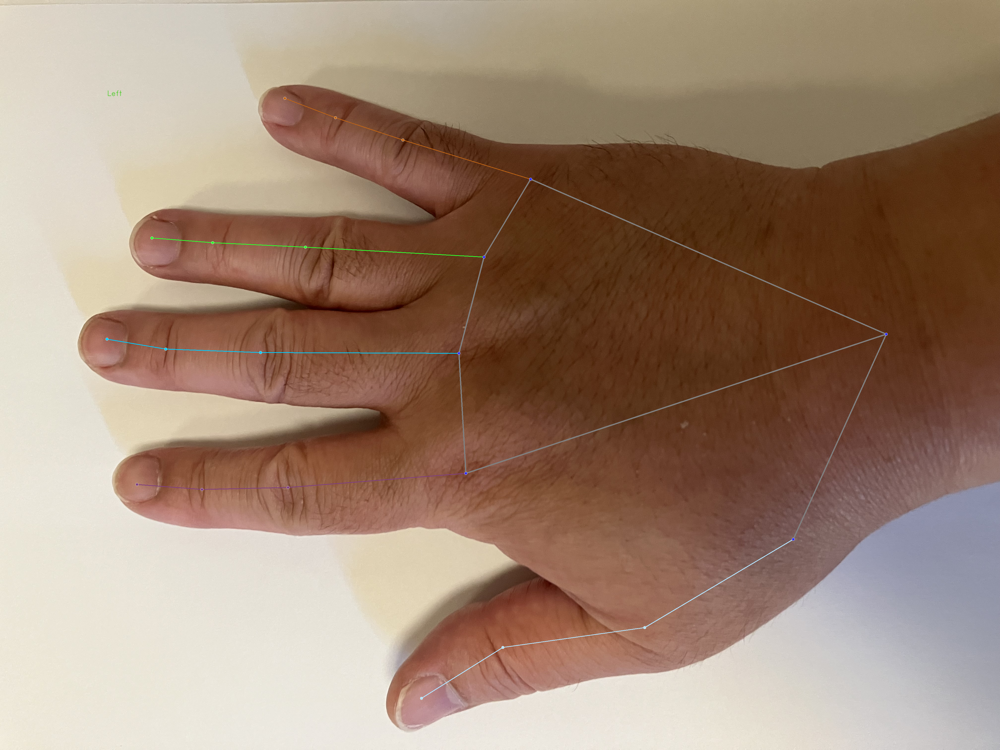

In [21]:
# STEP 1: Import the necessary modules.
import cv2
from google.colab.patches import cv2_imshow
import mediapipe as mp
from mediapipe.tasks import python
from mediapipe.tasks.python import vision

# STEP 2: Create an HandLandmarker object.
base_options = python.BaseOptions(model_asset_path='hand_landmarker.task')
options = vision.HandLandmarkerOptions(base_options=base_options,
                                       num_hands=2)
detector = vision.HandLandmarker.create_from_options(options)

#解析する画像をロードする。"image.jpg"の部分を画像ファイルの名前に変更すること。
image = mp.Image.create_from_file("/content/IMG_0302.jpeg")

# Detect hand landmarks and process them.
detection_result = detector.detect(image)
annotated_image = draw_landmarks_on_image(image.numpy_view(), detection_result)
cv2_imshow(cv2.cvtColor(annotated_image, cv2.COLOR_RGB2BGR))

In [ ]:
# 'cropped_landmarks'の部分を必要なディレクトリ名に変更すること。
save_cropped_images(image.numpy_view(), hand_landmarks, handedness, directory="cropped_landmarks")